<a href="https://colab.research.google.com/github/Abdulrahman-Albeladi/Computer-Vision/blob/main/3D.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **CMSC426 Project 3: From Pixels to 3D Worlds : Two-View 3D Reconstruction**

# **Introduction**

We've spent a lot of time working with images, mostly in 2D scenes. Remember Project 1, where we stitched images together by finding common features between them? Well, now it’s time to take things up a notch! Imagine being able to create a 3D view of a scene using just two images and figuring out exactly where the camera was positioned relative to that scene. Sounds exciting, right?

This approach is actually a simplified version of something called Structure from Motion (SfM). While SfM usually involves reconstructing 3D structures from many images taken from different angles, we’ll start with something more manageable: Two-View Reconstruction. Instead of dealing with a whole collection of viewpoints, we’ll be focusing on building a 3D structure using only two images taken from different perspectives. The key idea? Matching features between these two images to reconstruct the scene in 3D and understand how the camera moved between shots.

* Feature Matching
* Outlier Rejection using RANSAC & Estimating the Fundamental Matrix
*  Estimating the Essential Matrix from the Fundamental Matrix
*  Estimating Camera Pose from the Essential Matrix
* Checking for Cheirality Condition using Triangulation
* Linear Triangulation of Points

Reading Module : https://cmsc733.github.io/2022/proj/p3/

Video Lecture : [link](https://drive.google.com/file/d/1KxBYehdtbVpH4A0vsNwbLpuLsGNqYH8F/view?usp=sharing)

Allowed functions: Any functions regarding reading, writing and displaying/plotting images in cv2, matplotlib

Basic math utitlies including convolution operations in numpy and math



# **Step 1: Feature Matching**

In [ ]:
# Download data from Google Drive
import gdown
gdown.download_folder(id="1ROQl0NTBnxMjLrO5qISyxcTCJUPSMsRS", quiet=True, use_cookies=False)


['/content/project3/feature_points.npz',
 '/content/project3/image1.jpg',
 '/content/project3/image2.jpg',
 '/content/project3/intrinsics.npz',
 '/content/project3/monument_reconstruction.gif']

In [ ]:
def display_matches(img1, img2, pts1, pts2):
  #ASSUMPTION: pts1[0] is the match for pts2[0]
    #seems to be correct
  dmatches = []

  kp1 = []
  for x,y in pts1:
    kp1.append(cv2.KeyPoint(x.astype(float),y.astype(float),1))

  #convert corners into key point objects
  kp2 = []
  for x,y in pts2:
    kp2.append(cv2.KeyPoint(x.astype(float),y.astype(float),1))

  for i in range(len(pts1)):
    dmatches.append(cv2.DMatch(_queryIdx=i, _trainIdx=i, _distance=1))


  out = cv2.drawMatches(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB), kp1, cv2.cvtColor(img2, cv2.COLOR_BGR2RGB), kp2, dmatches, None)

  plt.figure(figsize=(16, 12))
  plt.imshow(out)
  plt.axis("off")
  plt.show()
  """
  Visualize the matching points between two images.

  Input:
      img1: Image 1 in numpy array format.
      img2: Image 2 in numpy array format.
      pts1: Matched points in Image 1 (numpy array of shape Nx2).
      pts2: Matched points in Image 2 (numpy array of shape Nx2).
  """

In [ ]:
def load_data(image1_path, image2_path,npz_path):
    # Load images
    img1 = cv2.imread(image1_path)
    img2 = cv2.imread(image2_path)

    # Load correspondences
    data = np.load(npz_path)
    pts1 = data['pts1']  # Nx2 array of points in the first image
    pts2 = data['pts2']  # Nx2 array of points in the second image
    return img1, img2,pts1, pts2

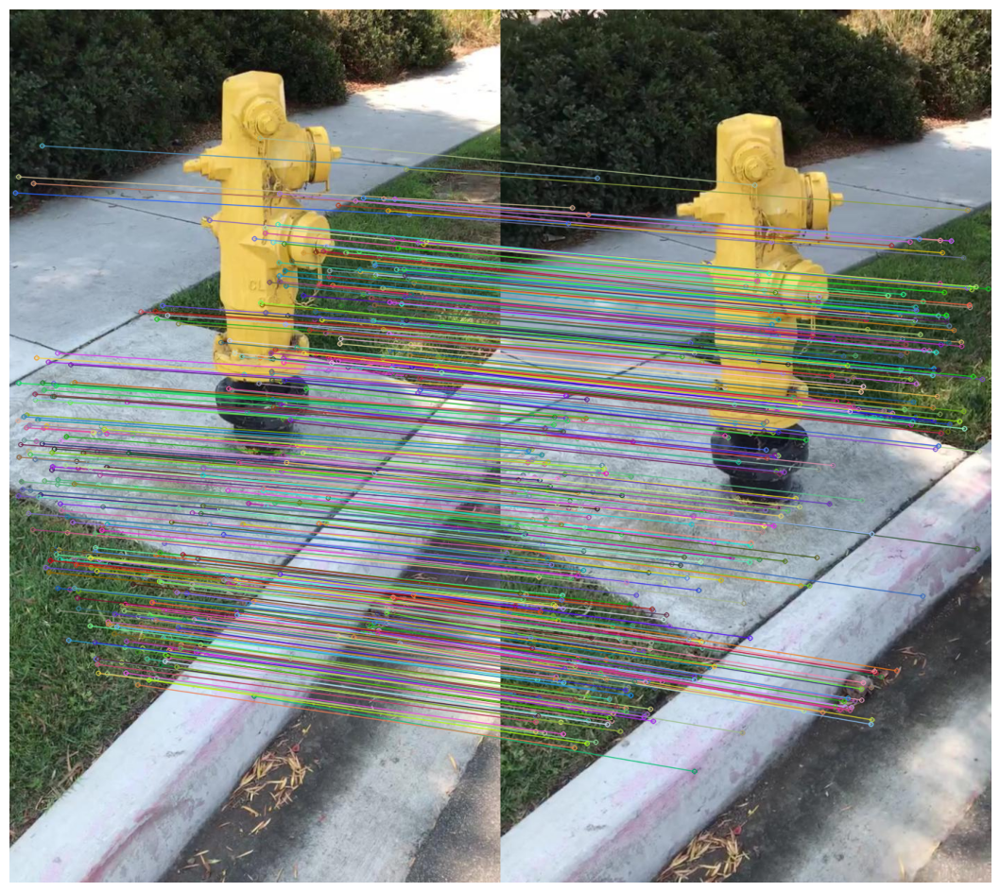

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
# File paths
image1_path = '/content/project3/image1.jpg'
image2_path = '/content/project3/image2.jpg'
npz_path = '/content/project3/feature_points.npz'
intrinsics = np.load('/content/project3/intrinsics.npz')
K1 = intrinsics['K1']
K2 = intrinsics['K2']
# Load and display matches
img1, img2,pts1, pts2 = load_data(image1_path, image2_path,npz_path)

display_matches(img1, img2, pts1, pts2)

<img src = "https://drive.google.com/uc?export=view&id=1wD6L8Zl2FM75HLn8sy9ub-13ae4Jz0Hk">


# **Step 2: Fundamental Matrix Estimation and RANSAC**
<img src="https://cmsc733.github.io/assets/2019/p3/ransac.png">

In [ ]:
#ASSUMPTION: 8 CORRSPONEDENCES ARE GIVEN IN IMG1_PTS AND IMG2_PTS
  #that is, random choice is done in RANSAC not here.
# def estimate_Fmatrix(img1_pts, img2_pts):

#   #build A
#   A = np.empty([8, 9], dtype=float)
#   for rowIndex in range(8):

#     row = np.array([img1_pts[rowIndex][0]*img2_pts[rowIndex][0], img1_pts[rowIndex][0]*img2_pts[rowIndex][1], img1_pts[rowIndex][0],
#                     img1_pts[rowIndex][1]*img2_pts[rowIndex][0], img1_pts[rowIndex][1]*img2_pts[rowIndex][1], img1_pts[rowIndex][1],
#                     img2_pts[rowIndex][0], img2_pts[rowIndex][1], 1])
#     A[rowIndex] = row


#   #obtain initial F
#   U, S, V = np.linalg.svd(A)
#   F = V[:,8].reshape(3,3)

#   #apply rank constraint
#   U, S, V = np.linalg.svd(F)
#   S[2] = 0
#   F = U @ np.diag(S) @ V

#   return F

def normalize_points_manual(points):
    mean = np.mean(points, axis=0)
    std = np.std(points, axis=0)
    T = np.array([[1/std[0],0, -mean[0]/std[0]],
                  [0,1/std[1], -mean[1]/std[1]],
                  [0,0,1]])

    norm_points = (T @ np.column_stack((points, np.ones(points.shape[0]))).T).T[:,:2]
    return norm_points, T

def estimate_Fmatrix(img1_pts, img2_pts):

    img1_pts, T1 = normalize_points_manual(img1_pts)
    img2_pts, T2 = normalize_points_manual(img2_pts)

    A = np.empty([8, 9], dtype=float)
    for rowIndex in range(8):
        row = np.array([img1_pts[rowIndex][0]*img2_pts[rowIndex][0], img1_pts[rowIndex][0]*img2_pts[rowIndex][1], img1_pts[rowIndex][0],
                    img1_pts[rowIndex][1]*img2_pts[rowIndex][0], img1_pts[rowIndex][1]*img2_pts[rowIndex][1], img1_pts[rowIndex][1],
                    img2_pts[rowIndex][0], img2_pts[rowIndex][1], 1])
        A[rowIndex] = row


    _, _, V = np.linalg.svd(A)
    F = V[-1].reshape(3, 3)
    U, S, V = np.linalg.svd(F)
    S[2] = 0
    F = U @ np.diag(S) @ V
    F = T2.T @ F @ T1  # Denormalize the fundamental matrix

    return F



"""
Estimate the Fundamental Matrix using matched points from two images.

Input:
    img1_pts: Matched points from Image 1 (numpy array of shape Nx2).
    img2_pts: Matched points from Image 2 (numpy array of shape Nx2).

Output:
    F: Estimated Fundamental Matrix (3x3 numpy array).
"""

'\nEstimate the Fundamental Matrix using matched points from two images.\n\nInput:\n    img1_pts: Matched points from Image 1 (numpy array of shape Nx2).\n    img2_pts: Matched points from Image 2 (numpy array of shape Nx2).\n\nOutput:\n    F: Estimated Fundamental Matrix (3x3 numpy array).\n'

In [ ]:
def ransac(pts1, pts2, iterations=10000, threshold=0.001):

    best_inliers= set() #holds indicies not the actual points
    best_F = None
    for i in range(iterations):
      choices1 = []
      choices2 = []
      for k in range(8):
        k = np.random.randint(0, len(pts1))
        choices1.append(pts1[k])
        choices2.append(pts2[k])
      F = estimate_Fmatrix(np.array(choices1), np.array(choices2))

      inliers = set()
      for j in range(len(pts1)):

        pt1 = np.append(pts1[j], 1)
        pt2 = np.append(pts2[j], 1)

        if np.abs(pt2.T @ F @ pt1) < threshold:
          inliers.add(j)

      if len(inliers) > len(best_inliers):
        best_inliers = inliers
        best_F = F

    img1_inliers = []
    img2_inliers = []
    for i in best_inliers:
      img1_inliers.append(pts1[i])
      img2_inliers.append(pts2[i])

    return img1_inliers, img2_inliers, best_F



    """
    Apply RANSAC to estimate the Fundamental Matrix robustly.

    Input:
        pts1: Points from Image 1 (numpy array of shape Nx2).
        pts2: Points from Image 2 (numpy array of shape Nx2).
        iterations: Number of RANSAC iterations (int).
        threshold: Distance threshold

    Output:
        img1_inliers: Inliers from Image 1 (numpy array of shape Mx2).
        img2_inliers: Inliers from Image 2 (numpy array of shape Mx2).
        best_F: Best Fundamental Matrix found (3x3 numpy array).
    """

Fundamental Matrix: [[-1.88640456e-08 -7.32240109e-07 -1.61018201e-04]
 [ 8.52428233e-07 -8.29989665e-09 -2.87648706e-03]
 [ 2.35754912e-04  2.93891913e-03  1.06684417e-01]]
rank(F) 2
det(F) -2.0387129381868355e-28
num_inliers: 115


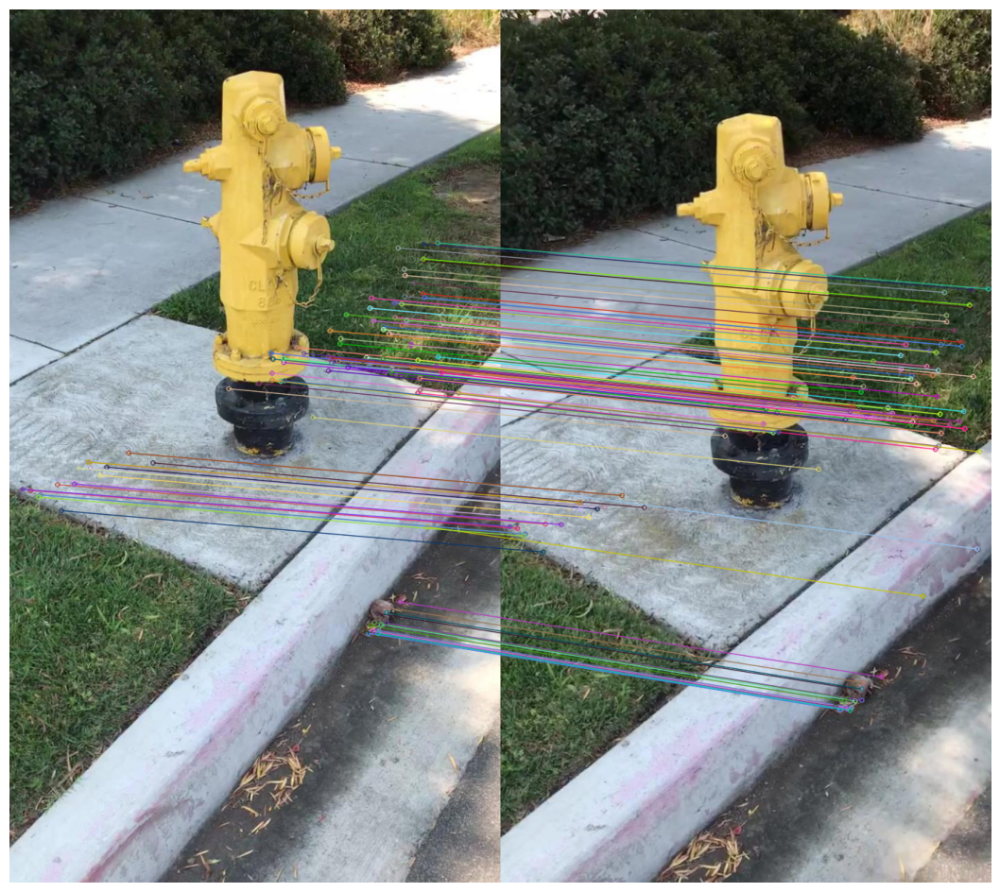

In [ ]:
img1_points, img2_points, F = ransac(pts1, pts2)
print("Fundamental Matrix:", F)
print(f"rank(F) {np.linalg.matrix_rank(F)}")
print(f"det(F) {np.linalg.det(F)}")
print(f"num_inliers: {len(img1_points)}")
display_matches(img1, img2, img1_points, img2_points)

# **Draw epipolar lines**

In [ ]:
def compute_epipolar_lines_manual(pts, F):

    lines = np.empty([len(pts), 3], dtype=float)

    for i, pt in enumerate(pts):
      pt = np.append(pt, 1)
      lines[i] = F@pt.T

    return lines


    """
    Compute epipolar lines for given points using the Fundamental Matrix.

    Input:
        pts: Points in homogeneous coordinates (numpy array of shape Nx2).
        F: Fundamental Matrix (3x3 numpy array).

    Output:
        lines: Epipolar lines in homogeneous form (Nx3 numpy array).

    Comments:
        - Converts points to homogeneous coordinates.
        - Computes lines using the Fundamental Matrix.
    """


# Function to draw epipolar lines on images

# draw lines on img1 show points on img2
def draw_epipolar_lines_img1_points_img2_lines(img1, img2, pts1, F):

  #make copy of images to avoid altering client's object
  img1 = img1.copy()
  img2 = img2.copy()

  #draw circles in img1
  for pt in pts1:
    x, y = int(pt[0]), int(pt[1])
    cv2.circle(img1,(x,y),3,(0,0,255),-1)

  #calculate lines
  lines = compute_epipolar_lines_manual(pts1, F)

  #draw lines
  for line in lines:
    x0 = 0
    y0 = int(-(line[0]*0 + line[2])/line[1])

    x1 = img2.shape[1]
    y1 = int(-(line[0]*img2.shape[1] + line[2])/line[1])

    cv2.line(img2, (x0,y0), (x1,y1), (0,0,0), 3)

  #display figures
  fig, axes = plt.subplots(1, 2, figsize=(12, 8))
  axes[0].imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
  axes[0].set_title('Image 1')
  axes[1].imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
  axes[1].set_title('Image 2')
  plt.show()



  """
  Draw epipolar lines on the second image for points from the first image.

  Input:
      img1: Image 1 in numpy array format.
      img2: Image 2 in numpy array format.
      pts1: Points in Image 1 (numpy array of shape Nx2).
      F: Fundamental Matrix (3x3 numpy array).

  """

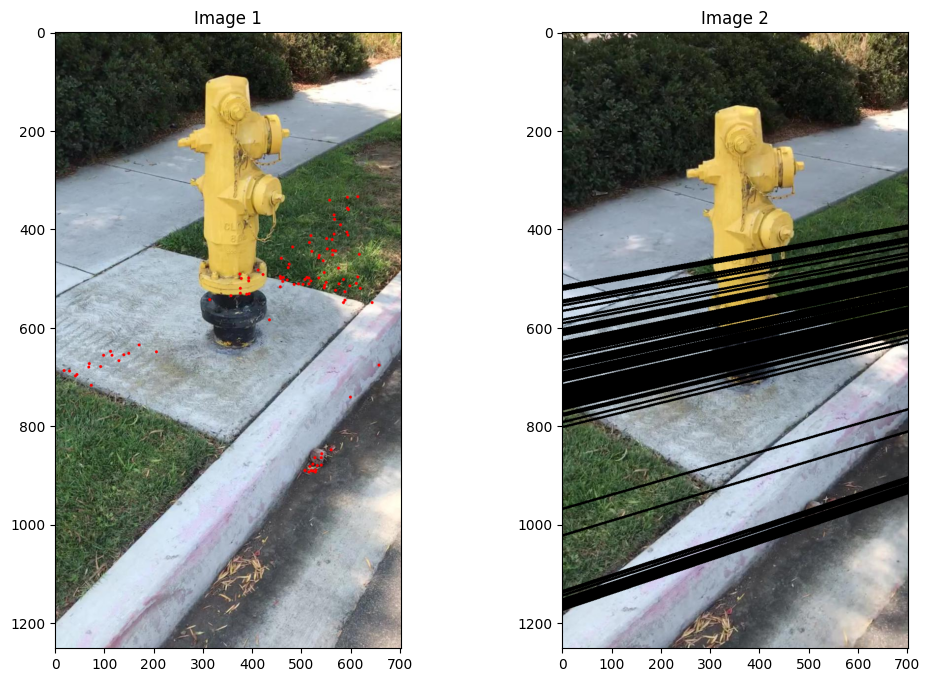

In [ ]:
# Draw epipolar lines based on the fundamental matrix
draw_epipolar_lines_img1_points_img2_lines(img1, img2, img1_points, F)

<img src = "https://drive.google.com/uc?export=view&id=1dx0RYxKdiYxuajkIbJhCaVPbYuTjM7Ss">
<img src = "https://drive.google.com/uc?export=view&id=1iINhm8GPlx-9c3P03KPuiGuKSARqoYPD">

# **Step 3: Estimate Essential Matrix E**



In [ ]:
def estimate_Essentialmatrix(K1, K2, F):

  return K2.T @ F @ K1

  """
  Estimate the Essential Matrix using camera intrinsics and the Fundamental Matrix.

  Input:
      K1: Intrinsic matrix of Camera 1 (3x3 numpy array).
      K2: Intrinsic matrix of Camera 2 (3x3 numpy array).
      F: Fundamental Matrix (3x3 numpy array).

  Output:
      E: Estimated Essential Matrix (3x3 numpy array).

  Comments:
      - Computes the Essential Matrix as E = K2.T * F * K
  """

In [ ]:
E = estimate_Essentialmatrix(K1, K2, F)
print("Essential Matrix E:",E)

Essential Matrix E: [[-0.02799939 -1.08684403 -0.76464224]
 [ 1.26523598 -0.01231931 -3.1531848 ]
 [ 0.92692006  3.25281086  0.19359409]]


# **Step 4: Extracting Poses form E matrix**
<img src = "https://drive.google.com/uc?export=view&id=1vizqzdm0gB4sRWQSrvZZPjwezW2OG5tE">




In [ ]:
def get_RTset(E):

   # SVD decomposition of the Essential Matrix
    U, _, Vt = np.linalg.svd(E)

    # Define W matrix as in the image
    W = np.array([[0, -1, 0],
                  [1,  0, 0],
                  [0,  0, 1]])

    # Compute the four possible rotations and translations
    R1 = U @ W @ Vt
    R2 = U @ W @ Vt
    R3 = U @ W.T @ Vt
    R4 = U @ W.T @ Vt
    print("Determinant for R1", np.linalg.det(R1))
    print("Determinant for R2", np.linalg.det(R2))
    print("Determinant for R3", np.linalg.det(R3))
    print("Determinant for R4", np.linalg.det(R4))

    # Possible translation vectors
    C1 = U[:,2]
    C2 = -U[:,2]
    C3 = U[:,2]
    C4 = -U[:,2]
    print("C1", C1)
    print("C2", C2)
    print("C3", C3)
    print("C4", C4)

    # Ensure det(R) = 1 for valid rotations
    if np.linalg.det(R1) < 0 :
        R1 = -R1
        C1 = -C1
    if np.linalg.det(R2) < 0:
        R2 = -R2
        C2 = -C2
    if np.linalg.det(R3) < 0:
        R3 = -R3
        C3 = -C3
    if np.linalg.det(R4)< 0:
        R4 = -R4
    # Package results
    R_set = [R1,R2,R3,R4]
    T_set = [C1.reshape(3,1),C2.reshape(3,1),C3.reshape(3,1),C4.reshape(3,1)]

    return R_set, T_set

    """
    Extract possible sets of rotation (R) and translation (T) from the Essential Matrix.

    Input:
        E: Essential Matrix (3x3 numpy array).

    Output:
        R: List of possible rotation matrices (4x 3x3 numpy arrays).
        T: List of possible translation vectors (4x 3x1 numpy arrays).

    Comments:
        - Uses SVD decomposition of the Essential Matrix.
        - Constructs four possible (R, T) pairs and ensures valid rotations

"""


In [ ]:
R_set, T_set = get_RTset(E)
print("Possible Rotations (R):", R_set)
print("Possible Translations (T):", T_set)

Determinant for R1 1.0000000000000002
Determinant for R2 1.0000000000000002
Determinant for R3 1.0000000000000002
Determinant for R4 1.0000000000000002
C1 [ 0.92832546 -0.20612166  0.3093957 ]
C2 [-0.92832546  0.20612166 -0.3093957 ]
C3 [ 0.92832546 -0.20612166  0.3093957 ]
C4 [-0.92832546  0.20612166 -0.3093957 ]
Possible Rotations (R): [array([[ 0.65979456, -0.44587208,  0.60487125],
       [-0.43129513, -0.88385543, -0.18106378],
       [ 0.61535002, -0.14141312, -0.77546546]]), array([[ 0.65979456, -0.44587208,  0.60487125],
       [-0.43129513, -0.88385543, -0.18106378],
       [ 0.61535002, -0.14141312, -0.77546546]]), array([[ 0.99594818, -0.0656079 ,  0.06150466],
       [ 0.06366065,  0.99742239,  0.03310435],
       [-0.06351803, -0.02905479,  0.99755766]]), array([[ 0.99594818, -0.0656079 ,  0.06150466],
       [ 0.06366065,  0.99742239,  0.03310435],
       [-0.06351803, -0.02905479,  0.99755766]])]
Possible Translations (T): [array([[ 0.92832546],
       [-0.20612166],
   

# **Step 5: Linear Triangulation**


In [ ]:
def linear_triangulation(R_Set, T_Set, pt1, pt2, k):

    points_3d_set = []
    num_points = len(pt1)

    for R, T in zip(R_Set, T_Set):
        # Compute projection matrices P1 and P2
        P1 = k @ np.hstack((np.identity(3), np.zeros((3, 1))))

        # Reshape T to be a 3x1 column vector before hstack
        T = np.array(T).reshape(3, 1)  # Ensure T has shape (3, 1)

        P2 = k @ np.hstack((R, T))

        # Triangulate each point pair
        points_3d = []
        for i in range(num_points):
            # Construct the linear system Ax = 0 for triangulation
            x1, y1 = pt1[i]
            x2, y2 = pt2[i]

            A = np.zeros((4, 4))
            A[0] = x1 * P1[2] - P1[0]
            A[1] = y1 * P1[2] - P1[1]
            A[2] = x2 * P2[2] - P2[0]
            A[3] = y2 * P2[2] - P2[1]

            # Solve the system using SVD
            _, _, Vt = np.linalg.svd(A)
            X = Vt[-1]  # The solution is the last row of V^T
            X = X / X[3]  # Convert from homogeneous to 3D coordinates

            points_3d.append(X[:3])

        points_3d_set.append(np.array(points_3d))  # Store 3D points for this (R, T) pair

    return points_3d_set

# **Step 6: Cheriality condition**

In [ ]:
# Function to select the best pose (R, T) based on the chirality condition
def extract_pose(R_set, T_set, pts_3d_set):
    best_count = -1
    best_index = -1
    R_best = None
    T_best = None
    X_best = None

    for i, (R, T, pts_3d) in enumerate(zip(R_set, T_set, pts_3d_set)):
        # Ensure T is a column vector (3x1)
        T = np.array(T).reshape(3, 1)

        # Chirality condition for Camera 1: Z coordinate > 0
        pts_cam1 = pts_3d[:, 2] > 0

        # Project points to Camera 2 and check chirality condition
        pts_cam2 = (R @ pts_3d.T + T).T
        pts_cam2_valid = pts_cam2[:, 2] > 0

        # Count points satisfying chirality in both cameras
        count = np.sum(pts_cam1 & pts_cam2_valid)

        # Update best pose if more points satisfy chirality
        if count > best_count:
            best_count = count
            best_index = i
            R_best = R
            T_best = T
            X_best = pts_3d

    return R_best, T_best, X_best, best_index
    """
    Select the best pose (R, T) that satisfies the chirality condition.

    Input:
        R_set: List of possible rotation matrices (4x 3x3 numpy arrays).
        T_set: List of possible translation vectors (4x 3x1 numpy arrays).
        pts_3d_set: List of 3D point sets for each (R, T) pair.

    Output:
        R_best: Best rotation matrix (3x3 numpy array).
        T_best: Best translation vector (3x1 numpy array).
        X_best: Best 3D points (Nx3 numpy array).
        index: Index of the best (R, T) pair.

    """

In [ ]:
def compute_cheriality(pt, r3, t):
    depth = (r3 @ pt.T + t).flatten()  # Depth for each point

    # Count points with positive depth
    count_depth = np.sum(depth > 0)

    return count_depth
    """
    Compute the chirality condition to determine if points are in front of the camera.

    Input:
        pt: 3D points (Nx3 numpy array).
        r3: Third row of the rotation matrix (1x3 numpy array).
        t: Translation vector (3x1 numpy array).

    Output:
        count_depth: Number of points with positive depth.

    """


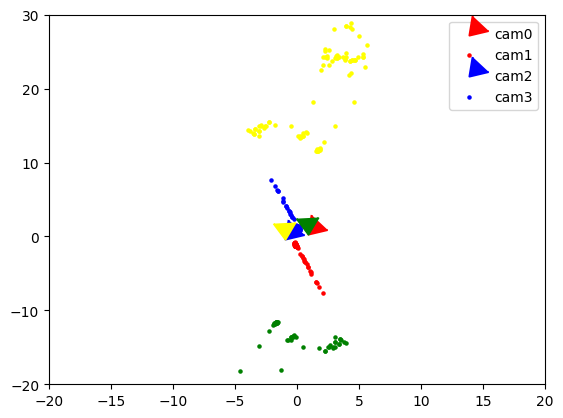

In [ ]:
from scipy.spatial.transform import Rotation
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np

# Linear Triangulation
point3D_set = linear_triangulation(R_set, T_set, img1_points, img2_points, K1)
colors = ['red','blue','green','yellow']
# Define colors for each camera
for i in range(len(R_set)):
    R = Rotation.from_matrix(R_set[i]).as_rotvec()
    R1 = np.rad2deg(R)
    t = mpl.markers.MarkerStyle(marker=mpl.markers.CARETDOWN)
    t._transform = t.get_transform().rotate_deg(int(R1[1]))
    ax = plt.gca()
    ax.scatter((T_set[i][0]), (T_set[i][2]), marker=t, s=250, color = colors[i])

    # Access the correct set of 3D points for the current camera pose
    points_3d = point3D_set[i]

    # Now you can use array indexing on 'points_3d'
    ax.scatter(points_3d[:, 0], points_3d[:, 2], marker='o', s=5, color = colors[i])

plt.legend(["cam0", "cam1", "cam2", "cam3"])
plt.xlim([-20, 20])
plt.ylim([-20, 30])
plt.show()


<img src = "https://drive.google.com/uc?export=view&id=186Z0ei48e8SV-lEajldKhtilU4r_vdQI">


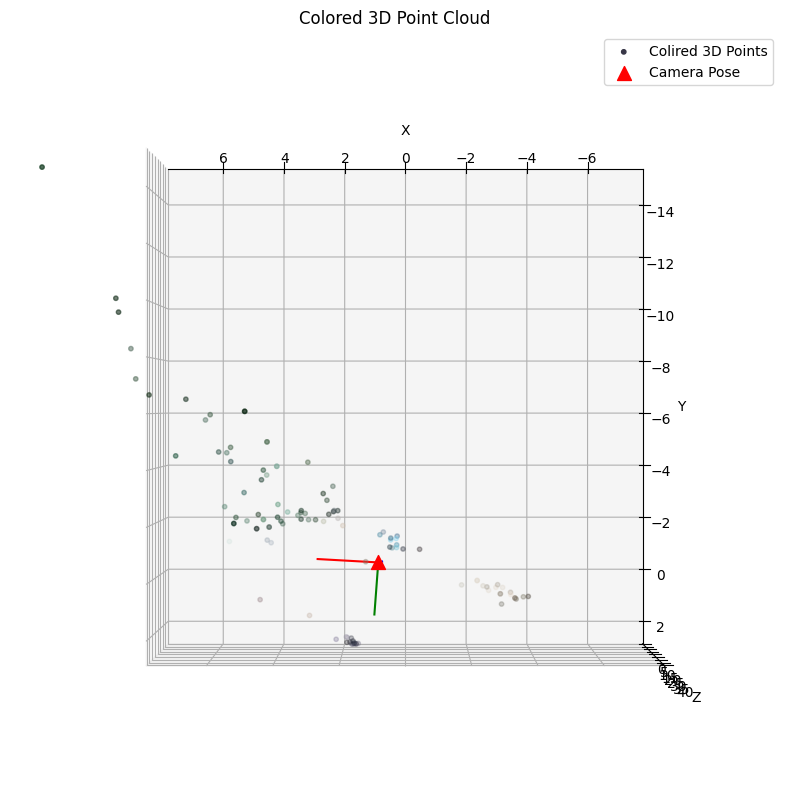

In [ ]:

R_best, T_best,X_ ,index= extract_pose(R_set,T_set,point3D_set)

colors = []
for pt1 in img1_points:
  x,y = int(pt1[0]), int(pt1[1])
  color = img1[y,x]
  colors.append(color)

colors = np.array(colors) / 255.0
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(X_[:, 0], X_[:, 1], X_[:, 2], c=colors, marker='o', s=10, label = "Colired 3D Points")

camera_center = -R_best.T @ T_best
camera_center = camera_center.flatten()
ax.scatter(camera_center[0], camera_center[1], camera_center[2], c='red', marker='^', s=100, label = "Camera Pose")

scale = 2
x_axis = camera_center + scale * R_best.T[:,0]
y_axis  =camera_center + scale * R_best.T[:,1]
z_axis = camera_center + scale * R_best.T[:,2]

ax.plot([camera_center[0], x_axis[0]], [camera_center[1], x_axis[1]], [camera_center[2], x_axis[2]], 'r-')
ax.plot([camera_center[0], y_axis[0]], [camera_center[1], y_axis[1]], [camera_center[2], y_axis[2]], 'g-')
ax.plot([camera_center[0], z_axis[0]], [camera_center[1], z_axis[1]], [camera_center[2], z_axis[2]], 'b-')

ax.set_xlim([-7.5, 7.5])
ax.set_ylim([-15, 2.5])
ax.set_zlim([0, 40])
ax.view_init(elev = 90, azim = 90)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')


ax.set_title("Colored 3D Point Cloud")
plt.legend()
plt.show()


<img src = "https://drive.google.com/uc?export=view&id=1KH5L6sUD0d291MAt9OZ2zHecIinTUoXR">


# **Reconstructing our Own Scene!**

For this part, you will run an off-the-shelf incremental SfM toolbox such as [COLMAP](https://github.com/colmap/pycolmap) on your own captured multi-view images. Please submit a GIF of the reconstructed 3D structure and the location of the cameras.

For this reconstruction, you can choose your own data. This data could either be a sequence with rigid objects (e.g., a mug or a vase from your vicinity) or any scene you wish to reconstruct in 3D.


Submission:

A gif to visualize the reconstruction of the scene and location of cameras.
<img src = "https://drive.google.com/uc?export=view&id=1MmeeYX77xcQlDVzsDRWyusD8XMO2AY-m">


**************************************************************

OUR GIF 1:

    car in parking garage. 77 hand taken images.
images: https://drive.google.com/drive/folders/1sz2StcfSyA-gXu3Yfc38KkEIjz5mvNVM?usp=sharing


<img src = "https://photos.fife.usercontent.google.com/pw/AP1GczO-k3_mLvrsQp3W8RhjDGOWaphIHCTNIiqXVQJK4hFBRsVihk5IUR4=w800-h520-s-no-gm?authuser=0">

**************************************************************

OUR GIF 2:
  
    car parked in front of garage (parallel to garage door). Took a video then extracted 384 evenly spaced frames from the video.

images: https://drive.google.com/drive/folders/1_jnnYpCzJzfc_mDhy8ezPV3v1tcwvCrM?usp=sharing

<img src = "https://lh3.googleusercontent.com/pw/AP1GczMwkglPLW3yp8JfM9t7GVapcy1mLjObEJTJSJ-p4MkGoF6sK_Kn2zRlIKMsET8C2rRXhOpArSN-uNXBjlBxphK_xD17t_1WgIhpabz0OvR5l-6YPpjEMHYme17dDhXeJ7TRPYQEYr5RQLpdm-GLw_w=w800-h520-s-no-gm">

In [ ]:
from IPython.display import Image
Image(filename='/content/animationBrownianMotion2d.gif')

FileNotFoundError: [Errno 2] No such file or directory: '/content/animationBrownianMotion2d.gif'

#Report
#Feature Matching
No issues with this function, it follows a lot of the same structure as the last project, but for this one we take the 2 point parameters and extract key points and draw the matches between the 2 images. As said before, this function had no issues upon completion.



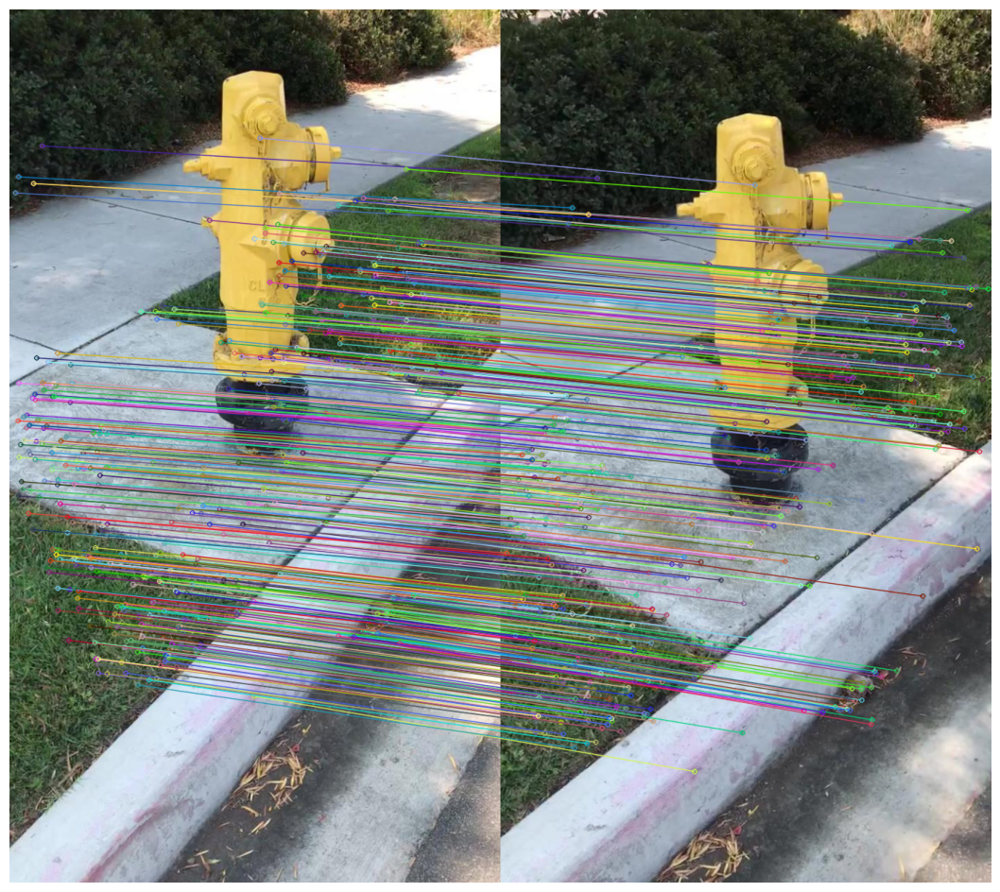

In [ ]:
#@title Output:

import cv2
import numpy as np
import matplotlib.pyplot as plt
# File paths
image1_path = '/content/project3/image1.jpg'
image2_path = '/content/project3/image2.jpg'
npz_path = '/content/project3/feature_points.npz'
intrinsics = np.load('/content/project3/intrinsics.npz')
K1 = intrinsics['K1']
K2 = intrinsics['K2']
# Load and display matches
img1, img2,pts1, pts2 = load_data(image1_path, image2_path,npz_path)

display_matches(img1, img2, pts1, pts2)

#Estimate f matrix
For this function we opt to use a different approach to calculating the FMatrix in that we normalize the points for each image. This lets us get better FMatrixes (or better points in general) for the later stages of the project. The 2 Rank constraint was implemented by setting the Singular value matrix from SVD and setting it zero to strictly have a rank 2 F matrix. Some issues that came from this function is that using the last row of the matrix (:,8) caused issues with our epipolar line creation where its lines become almost parallel and inconsistent with the results we wanted. So we used -1 instead to get the whole matrix to get a better idea on what we are working with and it did work in improving our Fmatrix and epipolar line/ransac implementation


#RANSAC
Just like the previous project and the one that came before, RANSAC is here again and is implemented much the same as before but with tweaks for this specific project. It's used alongside estimated FMatrix in order to see what lines are accepted. It looks through 2 images and appends the best inliners for both images which would later be used to create the epipolar lines. Some issues that came with this function is depending on how the estimated FMatrix was implemented, the usage of different threshold levels was needed. For this specific version of estimated FMatrix, we opt to use 0.001 to give us a good amount of inliers. And since we are normalizing the points for better results the conversion choices in an array was needed for this process to work.


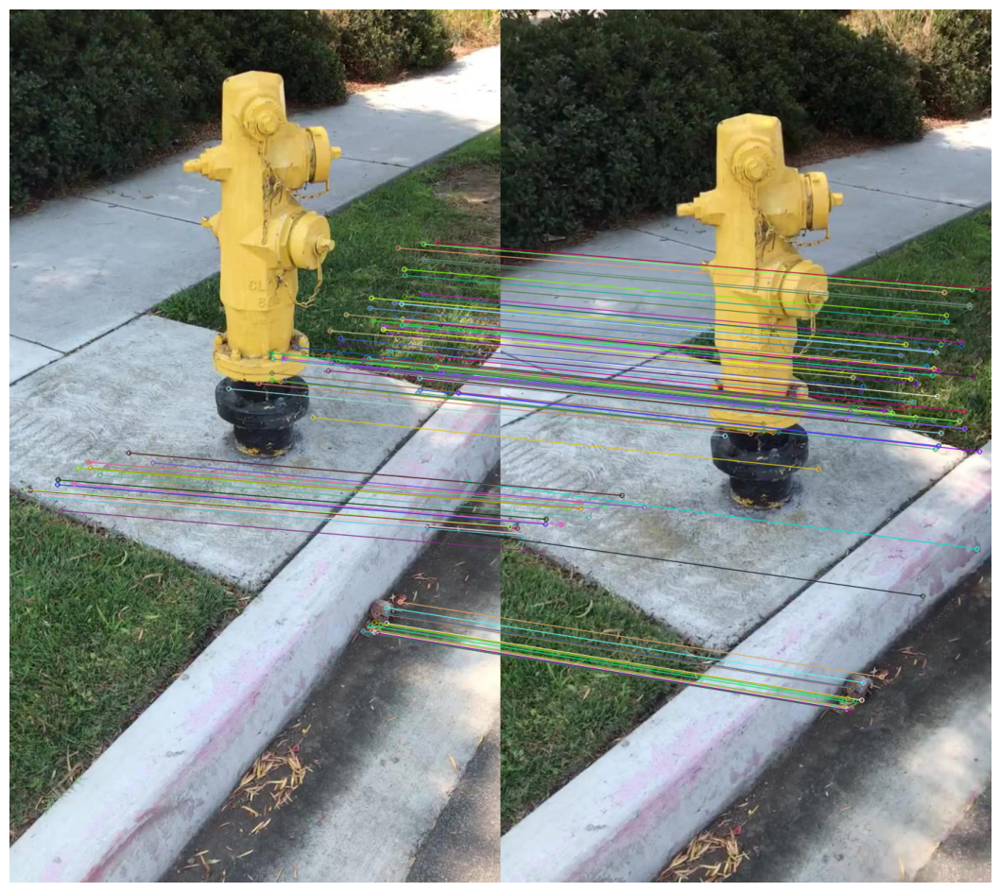

In [ ]:
#@title Output:
display_matches(img1, img2, img1_points, img2_points)

#Drawing Epipolar Lines
First we computed the epipolar lines manually by converting each points to homogoneous coordinates and using them to compute the lines with the fundemental matrix. Than we can draw the lines from img2 using the points from img1. The results of the points of img1 are displayed on the left and the lines of img2 are on the right. A number of issues came from this function in that like RANSAC, it depended on how the FMatrix was calculated. There would be instances of our lines in img2 being parallel, the lines converging ontop of the image, to the right of the image, and the left of the image. So alot of mixed results came and per iteration the lines would be different everytime. The best way our lines can look close to what we wanted would be to normalize the points as mentioned before which gave us the best lines we can get. But overall, this function could work on one iteration or it would not look pretty on another.

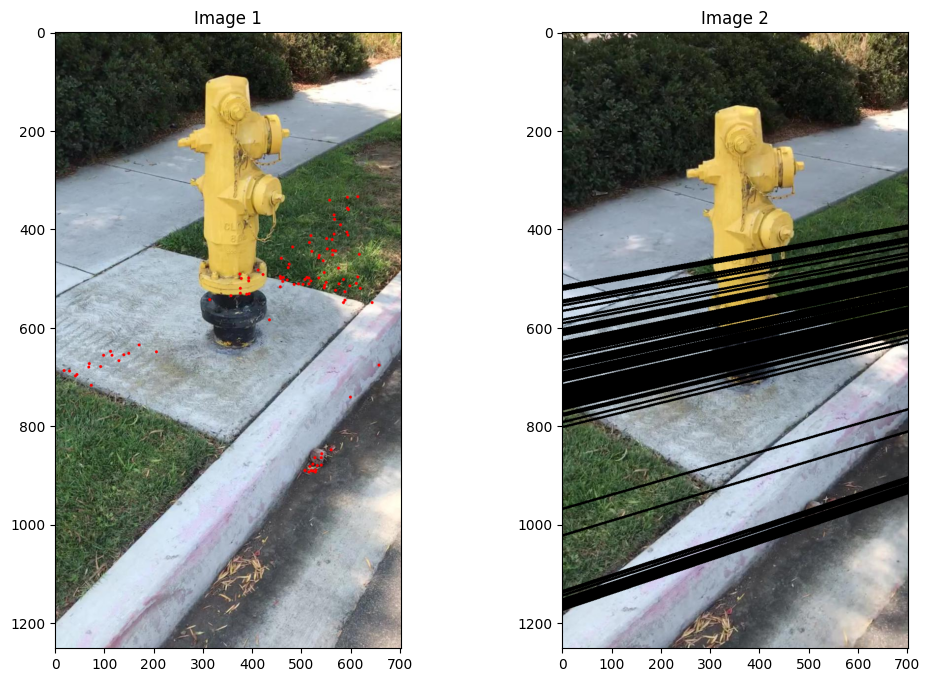

In [ ]:
#@title Output:
draw_epipolar_lines_img1_points_img2_lines(img1, img2, img1_points, F)




#Extracting Poses From E Matrix
Single value decomposition to create the essentials matrix E = UDV^T. A matrix W is created based off the image for the function
Rotation matrix is computed as described on the image with correct use of transposing of V matrix and D matrix.
Translation vectors are created based off of the image with translation vectors C2 and C4 are negative and the other two are positive.
To ensure valid rotations each rotation matrix determinant will have to be greater than -1, otherwise its rotation/translation matrix is corrected as according to the description.
The end result is the R_Set and T_Set with the T_Set reshaping into 3x1  matrices
No specific problems were displayed on this function, one comment is that each time the project is run, the determinant also changes to a value close to 1, or slightly above 1, and even at 1. Otherwise no other problems occurred.

#Linear Triangulation
We used these slides as a reference which were posted to piazza
https://www.cs.cmu.edu/~16385/s17/Slides/11.4_Triangulation.pdf
We followed the slides to set up and solve the homogeneous linear system using SVD
No idea how to check if it looks good though besides for plotting it which didn’t look crazy
#Cheriality Condition
We just needed to check that the 3d points are in front of the reconstructed camera, meaning that they had a positive depth and return those that did.
To extract the pose. We just checked which had the most points that passed the cheriality condition and returned that as the best pose for the image. As for any issues or problems, this was a small function that didn't have much use in our code so not thing troublesome came from this function.

#Visualization (Tied with Linear Triangulation and Cheriality Condition and Extract Poses)
For the 2D plot it was relatively simple to create, we graph each rotation and translation matrix which corresponds to the triangles on the visualization and classified them as camera poses. The points were graphed separately and color coded to match with their respective camera poses. An issue that we come across is that depending on the iteration, the camera poses would be inverted, but the overall structure would be correct.


For the 3D cloud plot, it was more difficult in that we had to plot points that matched with the colors from the images. So we have to extract the pixels from the images and plot the points where the colors that they belong to. Since this is a 3D graph, each axis must be scaled appropriately as the points could fall out of the graph in some iterations of the code. The camera poses just like the 2D images are extracted and put into the graph marked as Red triangle. Known issues for this graph would be the points falling outside the graph, and also the color yellow not being properly collected from the pixel extraction portion of the code.



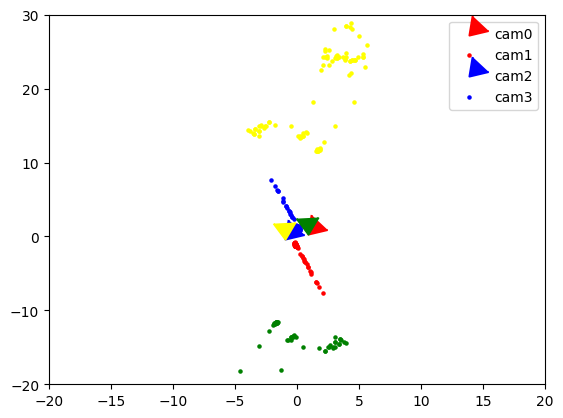

In [ ]:
#@title Output: 2D

from scipy.spatial.transform import Rotation
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np

# Linear Triangulation
point3D_set = linear_triangulation(R_set, T_set, img1_points, img2_points, K1)
colors = ['red','blue','green','yellow']
# Define colors for each camera
for i in range(len(R_set)):
    R = Rotation.from_matrix(R_set[i]).as_rotvec()
    R1 = np.rad2deg(R)
    t = mpl.markers.MarkerStyle(marker=mpl.markers.CARETDOWN)
    t._transform = t.get_transform().rotate_deg(int(R1[1]))
    ax = plt.gca()
    ax.scatter((T_set[i][0]), (T_set[i][2]), marker=t, s=250, color = colors[i])

    # Access the correct set of 3D points for the current camera pose
    points_3d = point3D_set[i]

    # Now you can use array indexing on 'points_3d'
    ax.scatter(points_3d[:, 0], points_3d[:, 2], marker='o', s=5, color = colors[i])

plt.legend(["cam0", "cam1", "cam2", "cam3"])
plt.xlim([-20, 20])
plt.ylim([-20, 30])
plt.show()


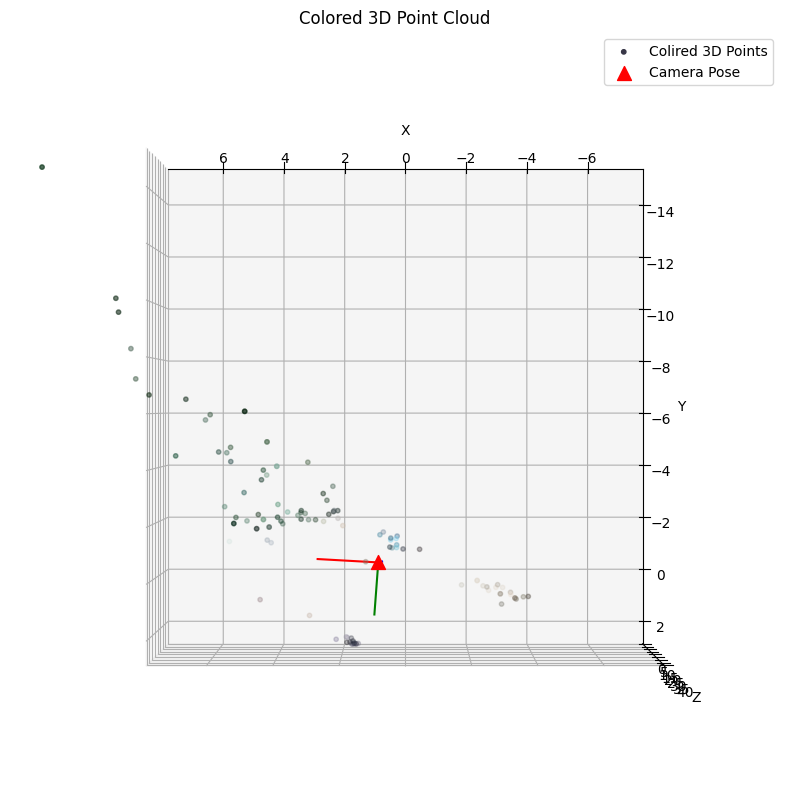

In [ ]:
no
R_best, T_best,X_ ,index= extract_pose(R_set,T_set,point3D_set)

colors = []
for pt1 in img1_points:
  x,y = int(pt1[0]), int(pt1[1])
  color = img1[y,x]
  colors.append(color)

colors = np.array(colors) / 255.0
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(X_[:, 0], X_[:, 1], X_[:, 2], c=colors, marker='o', s=10, label = "Colired 3D Points")

camera_center = -R_best.T @ T_best
camera_center = camera_center.flatten()
ax.scatter(camera_center[0], camera_center[1], camera_center[2], c='red', marker='^', s=100, label = "Camera Pose")

scale = 2
x_axis = camera_center + scale * R_best.T[:,0]
y_axis  =camera_center + scale * R_best.T[:,1]
z_axis = camera_center + scale * R_best.T[:,2]

ax.plot([camera_center[0], x_axis[0]], [camera_center[1], x_axis[1]], [camera_center[2], x_axis[2]], 'r-')
ax.plot([camera_center[0], y_axis[0]], [camera_center[1], y_axis[1]], [camera_center[2], y_axis[2]], 'g-')
ax.plot([camera_center[0], z_axis[0]], [camera_center[1], z_axis[1]], [camera_center[2], z_axis[2]], 'b-')

ax.set_xlim([-7.5, 7.5])
ax.set_ylim([-15, 2.5])
ax.set_zlim([0, 40])
ax.view_init(elev = 90, azim = 90)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

ax.set_title("Colored 3D Point Cloud")
plt.legend()
plt.show()


Project Inspiration Credit to CMSC733 COmputer Vision and 16-822: Geometry-based Methods in Vision
